In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [10]:
!python --version

Python 3.11.13


In [1]:
#Installs CLIP
!git clone https://github.com/openai/CLIP                 &> /dev/null

#Installs Python Libraries for AI
!git clone https://github.com/CompVis/taming-transformers &> /dev/null
!pip install transformers                                 &> /dev/null
!pip install ftfy regex tqdm omegaconf pytorch-lightning  &> /dev/null
!pip install kornia                                       &> /dev/null
!pip install einops                                       &> /dev/null
!pip install wget                                         &> /dev/null

#Installs libraries for metadata management
!pip install stegano                                      &> /dev/null
!apt install exempi                                       &> /dev/null
!pip install python-xmp-toolkit                           &> /dev/null
!pip install imgtag                                       &> /dev/null
!pip install pillow==9.4.0                                &> /dev/null

#Installs Python libraries for creating videos
!pip install imageio-ffmpeg                               &> /dev/null
!mkdir steps

print("Installation completed!")

mkdir: cannot create directory ‘steps’: File exists
Installation completed!


In [3]:
import torch
torch.__version__

'2.8.0+cu128'

In [4]:
#downloads imagenet_1024:
!curl -L -o vqgan_imagenet_f16_1024.yaml -C - 'https://heibox.uni-heidelberg.de/d/8088892a516d4e3baf92/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1'
!curl -L -o vqgan_imagenet_f16_1024.ckpt -C - 'https://heibox.uni-heidelberg.de/d/8088892a516d4e3baf92/files/?p=%2Fckpts%2Flast.ckpt&dl=1'

#downloads imagenet_16384:
!curl -L -o vqgan_imagenet_f16_16384.yaml -C - 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fconfigs%2Fmodel.yaml&dl=1'
!curl -L -o vqgan_imagenet_f16_16384.ckpt -C - 'https://heibox.uni-heidelberg.de/d/a7530b09fed84f80a887/files/?p=%2Fckpts%2Flast.ckpt&dl=1'

** Resuming transfer from byte position 645
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100     1  100     1    0     0      1      0  0:00:01 --:--:--  0:00:01     0
** Resuming transfer from byte position 957954257
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100     1  100     1    0     0      1      0  0:00:01 --:--:--  0:00:01     1
** Resuming transfer from byte position 692
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--

In [5]:
from pathlib import Path
import argparse
import math
import sys

In [6]:
sys.path.append('./taming-transformers')

In [10]:
from vq_helper_functions import *

## Input Prompt
> **Settings**

- `texts`: The text prompt(s) you want the AI to generate an image from.
  - You can include multiple prompts by separating them with `|`, e.g. `nebula | pizza`
  - You can apply a weight to each prompt by appending `:{weight}` to each prompt. The AI will attempt to favor prompts with a higher weight, e.g. `nebula:3 | pizza`
  - Tip: You can apply a negative weight to get the *opposite* of what the text is

- `width`, `height`: Width and height of the image (pixels). Smaller images are faster generated but they have less details
  - 600x600 pixels will cause out-of-memory
  
- `model` - the model you want to use to generate the images

- `init_image`: The initial image filename for starting generating the images

- `target_images`: The target image filename(s)

- `seed` - the same concept we've seen during the course.
  - `-1`  means it will generate a randon number every time

> **Training Settings**

- `learning_rate`: Learning rate
  - ~0.2 is recommend if training without an `init_image`; ~0.1 is recommended if using one.

- `max_steps`: Number of steps for training the model; the more steps, the better the images.

- `images_interval`: Number of steps for training

- `max_iterations` - after iterations, the image stops evolving and you won't get better results, so you can set a max iteration.

In [11]:
texts = "a fantasy kingdom"
width, height = 300, 300
model = 'vqgan_imagenet_f16_16384'
images_interval = 50
init_image = ""
target_images = ""
seed = 1305229777650133088
max_iterations = 700
input_images = ""

model_names = {"vqgan_imagenet_f16_16384": 'ImageNet 16384',
               "vqgan_imagenet_f16_1024": 'ImageNet 1024'}
model_name = model_names[model]

if seed == -1:
  seed = None

if init_image == "None":
  init_image = None
elif init_image and init_image.lower().startswith("http"):
  init_image = download_img(init_image)

if target_images == "None" or not target_images:
    target_images = []
else:
    target_images = target_images.split("|")
    target_images = [image.strip() for image in target_images]

if init_image or target_images != []:
    input_images = True

texts = [sentence.strip() for sentence in texts.split("|")]
if texts == ['']:
    texts = []

> Suggestions:

* a fantasy world

* painting of a sunset at beach

* a futuristic city on another planet, artstation

* psychedelic tree

* fantasy city on a sunny day, game of thrones, massive castle

* scene from a video game graphics Unreal

* [object or scene] painted by van gogh (or other famous painter)

* painting of small cabin in the middle of snowy mountains in the winter at night in the style of disney trending on artstation | unreal engine

In [12]:
args = argparse.Namespace(
    prompts=texts,
    image_prompts=target_images,
    noise_prompt_seeds=[],
    noise_prompt_weights=[],
    size=[width, height],
    init_image=init_image,
    init_weight=0.,
    clip_model='ViT-B/32',
    vqgan_config=f'{model}.yaml',
    vqgan_checkpoint=f'{model}.ckpt',
    step_size=0.1,
    cutn=64,
    cut_pow=1.,
    display_freq=images_interval,
    seed=seed
)
args

Namespace(prompts=['a fantasy kingdom'], image_prompts=[], noise_prompt_seeds=[], noise_prompt_weights=[], size=[300, 300], init_image='', init_weight=0.0, clip_model='ViT-B/32', vqgan_config='vqgan_imagenet_f16_16384.yaml', vqgan_checkpoint='vqgan_imagenet_f16_16384.ckpt', step_size=0.1, cutn=64, cut_pow=1.0, display_freq=50, seed=1305229777650133088)

In [14]:
import torch
import pytorch_lightning

**Generating the Image**

Cleared Accounted PIDs for GPU 00000000:00:04.0.
All done.
Using device: cuda:0
Using text prompt: ['a fantasy kingdom']
Using seed: 1305229777650133088
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
Restored from vqgan_imagenet_f16_16384.ckpt


100%|███████████████████████████████████████| 338M/338M [00:04<00:00, 84.8MiB/s]


0it [00:00, ?it/s]

i: 0, loss: 0.939041, losses: 0.939041


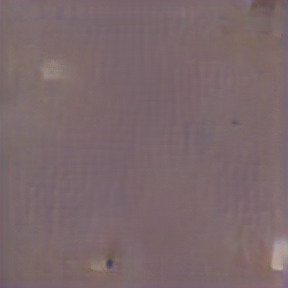

i: 50, loss: 0.810059, losses: 0.810059


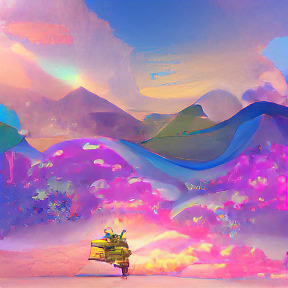

i: 100, loss: 0.749846, losses: 0.749846


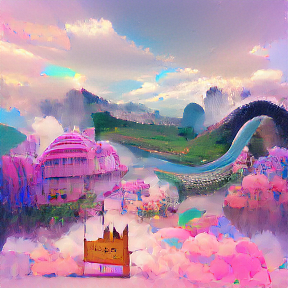

i: 150, loss: 0.729133, losses: 0.729133


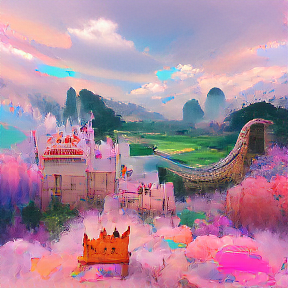

i: 200, loss: 0.721632, losses: 0.721632


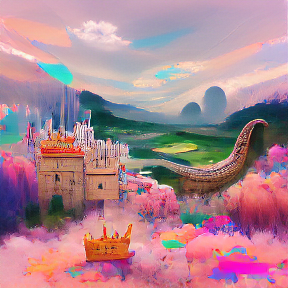

i: 250, loss: 0.719785, losses: 0.719785


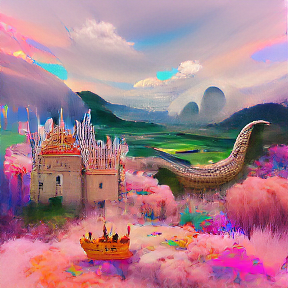

i: 300, loss: 0.713367, losses: 0.713367


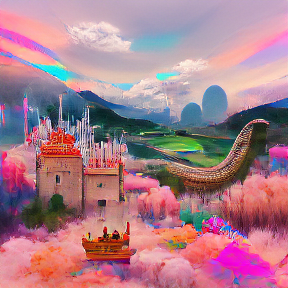

i: 350, loss: 0.719124, losses: 0.719124


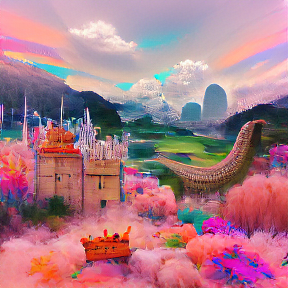

i: 400, loss: 0.712702, losses: 0.712702


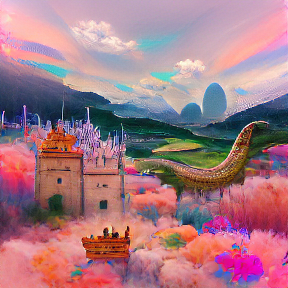

i: 450, loss: 0.716294, losses: 0.716294


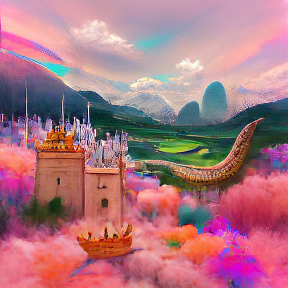

i: 500, loss: 0.71428, losses: 0.71428


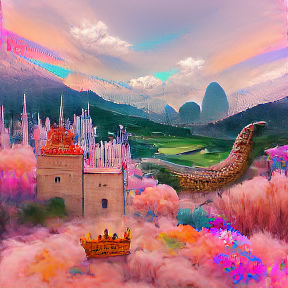

i: 550, loss: 0.710748, losses: 0.710748


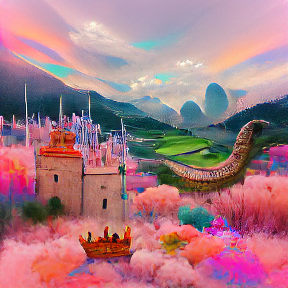

i: 600, loss: 0.709202, losses: 0.709202


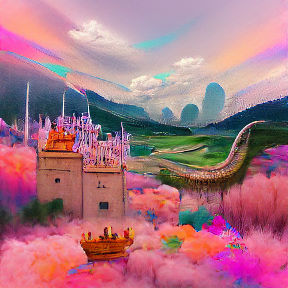

i: 650, loss: 0.712122, losses: 0.712122


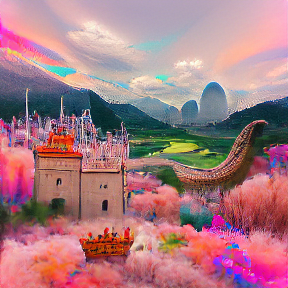

i: 700, loss: 0.711431, losses: 0.711431


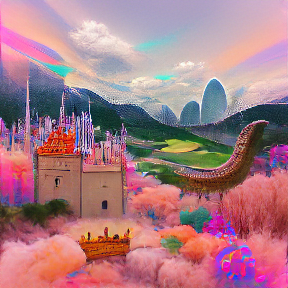

In [16]:
!nvidia-smi -caa # Delete memory from previous runs

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

print('Using device:', device)
if texts:
    print('Using text prompt:', texts)
if target_images:
    print('Using image prompts:', target_images)
if args.seed is None:
    seed = torch.seed()
else:
    seed = args.seed
torch.manual_seed(seed)
print('Using seed:', seed)

torch.serialization.add_safe_globals([pytorch_lightning.callbacks.model_checkpoint.ModelCheckpoint])
model = load_vqgan_model(args.vqgan_config, args.vqgan_checkpoint).to(device)
perceptor = clip.load(args.clip_model, jit=False)[0].eval().requires_grad_(False).to(device)

cut_size = perceptor.visual.input_resolution
e_dim = model.quantize.e_dim
f = 2**(model.decoder.num_resolutions - 1)
make_cutouts = MakeCutouts(cut_size, args.cutn, cut_pow=args.cut_pow)
n_toks = model.quantize.n_e
toksX, toksY = args.size[0] // f, args.size[1] // f
sideX, sideY = toksX * f, toksY * f
z_min = model.quantize.embedding.weight.min(dim=0).values[None, :, None, None]
z_max = model.quantize.embedding.weight.max(dim=0).values[None, :, None, None]


if args.init_image:
    pil_image = Image.open(args.init_image).convert('RGB')
    pil_image = pil_image.resize((sideX, sideY), Image.LANCZOS)
    z, *_ = model.encode(TF.to_tensor(pil_image).to(device).unsqueeze(0) * 2 - 1)
else:
    one_hot = F.one_hot(torch.randint(n_toks, [toksY * toksX], device=device), n_toks).float()
    z = one_hot @ model.quantize.embedding.weight
    z = z.view([-1, toksY, toksX, e_dim]).permute(0, 3, 1, 2)
z_orig = z.clone()
z.requires_grad_(True)
opt = optim.Adam([z], lr=args.step_size)

normalize = transforms.Normalize(mean=[0.48145466, 0.4578275, 0.40821073],
                                 std=[0.26862954, 0.26130258, 0.27577711])

pMs = []

for prompt in args.prompts:
    txt, weight, stop = parse_prompt(prompt)
    embed = perceptor.encode_text(clip.tokenize(txt).to(device)).float()
    pMs.append(Prompt(embed, weight, stop).to(device))

for prompt in args.image_prompts:
    path, weight, stop = parse_prompt(prompt)
    img = resize_image(Image.open(path).convert('RGB'), (sideX, sideY))
    batch = make_cutouts(TF.to_tensor(img).unsqueeze(0).to(device))
    embed = perceptor.encode_image(normalize(batch)).float()
    pMs.append(Prompt(embed, weight, stop).to(device))

for seed, weight in zip(args.noise_prompt_seeds, args.noise_prompt_weights):
    gen = torch.Generator().manual_seed(seed)
    embed = torch.empty([1, perceptor.visual.output_dim]).normal_(generator=gen)
    pMs.append(Prompt(embed, weight).to(device))

def synth(z):
    z_q = vector_quantize(z.movedim(1, 3), model.quantize.embedding.weight).movedim(3, 1)
    return clamp_with_grad(model.decode(z_q).add(1).div(2), 0, 1)

def add_xmp_data(nombrefichero):
    image = ImgTag(filename=nombrefichero)
    image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'creator', 'VQGAN+CLIP', {"prop_array_is_ordered":True, "prop_value_is_array":True})
    if args.prompts:
        image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'title', " | ".join(args.prompts), {"prop_array_is_ordered":True, "prop_value_is_array":True})
    else:
        image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'title', 'None', {"prop_array_is_ordered":True, "prop_value_is_array":True})
    image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'i', str(i), {"prop_array_is_ordered":True, "prop_value_is_array":True})
    image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'model', model_name, {"prop_array_is_ordered":True, "prop_value_is_array":True})
    image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'seed',str(seed) , {"prop_array_is_ordered":True, "prop_value_is_array":True})
    image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'input_images',str(input_images) , {"prop_array_is_ordered":True, "prop_value_is_array":True})
    #for frases in args.prompts:
    #    image.xmp.append_array_item(libxmp.consts.XMP_NS_DC, 'Prompt' ,frases, {"prop_array_is_ordered":True, "prop_value_is_array":True})
    image.close()

def add_stegano_data(filename):
    data = {
        "title": " | ".join(args.prompts) if args.prompts else None,
        "notebook": "VQGAN+CLIP",
        "i": i,
        "model": model_name,
        "seed": str(seed),
        "input_images": input_images
    }
    lsb.hide(filename, json.dumps(data)).save(filename)

@torch.no_grad()
def checkin(i, losses):
    losses_str = ', '.join(f'{loss.item():g}' for loss in losses)
    tqdm.write(f'i: {i}, loss: {sum(losses).item():g}, losses: {losses_str}')
    out = synth(z)
    TF.to_pil_image(out[0].cpu()).save('progress.png')
    add_stegano_data('progress.png')
    add_xmp_data('progress.png')
    display.display(display.Image('progress.png'))

def ascend_txt():
    global i
    out = synth(z)
    iii = perceptor.encode_image(normalize(make_cutouts(out))).float()

    result = []

    if args.init_weight:
        result.append(F.mse_loss(z, z_orig) * args.init_weight / 2)

    for prompt in pMs:
        result.append(prompt(iii))
    img = np.array(out.mul(255).clamp(0, 255)[0].cpu().detach().numpy().astype(np.uint8))[:,:,:]
    img = np.transpose(img, (1, 2, 0))
    filename = f"steps/{i:04}.png"
    imageio.imwrite(filename, np.array(img))
    add_stegano_data(filename)
    add_xmp_data(filename)
    return result

def train(i):
    opt.zero_grad()
    lossAll = ascend_txt()
    if i % args.display_freq == 0:
        checkin(i, lossAll)
    loss = sum(lossAll)
    loss.backward()
    opt.step()
    with torch.no_grad():
        z.copy_(z.maximum(z_min).minimum(z_max))

i = 0
try:
    with tqdm() as pbar:
        while True:
            train(i)
            if i == max_iterations:
                break
            i += 1
            pbar.update()
except KeyboardInterrupt:
    pass

**Generating Video**

In [17]:
init_frame = 1
last_frame = i

min_fps = 10
max_fps = 30

total_frames = last_frame-init_frame

length = 15

frames = []
tqdm.write('Generating video...')
for i in range(init_frame,last_frame): #
    filename = f"steps/{i:04}.png"
    frames.append(Image.open(filename))

#fps = last_frame/10
fps = np.clip(total_frames/length,min_fps,max_fps)

from subprocess import Popen, PIPE
p = Popen(['ffmpeg', '-y', '-f', 'image2pipe', '-vcodec', 'png', '-r', str(fps), '-i', '-', '-vcodec', 'libx264', '-r', str(fps), '-pix_fmt', 'yuv420p', '-crf', '17', '-preset', 'veryslow', 'video.mp4'], stdin=PIPE)
for im in tqdm(frames):
    im.save(p.stdin, 'PNG')
p.stdin.close()

print("The video is now being compressed, wait...")
p.wait()
print("The video is ready")

Generating video...


  0%|          | 0/699 [00:00<?, ?it/s]

The video is now being compressed, wait...
The video is ready


In [18]:
final_video = open('video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(final_video).decode()
display.HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)